## 1. Import Necessary Libraries

In [1]:
import pandas as pd
import nltk
import numpy as np
import matplotlib.pyplot as plt
import string
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import LeaveOneOut
from sklearn import naive_bayes

## for model evaluation metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score



In [2]:
## set display option to show all rows and columns in the dataframe

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

## Data Import
### Importing manually labelled data

In [3]:
df_labelled = pd.read_csv('manual_labels.csv', index_col = 0).reset_index(drop = True)

df_labelled.head()

,city,name,reviews,rating,review_id,review_text,review_rating,review_datetime_utc,Labels
0,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUN1ck1tNGR3EAE,You will find Ethiopian traditional items and raw materials (teff and wheat) for Injera and bread,5,7/22/2022 20:52,1
1,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSURTeC1ETGJ3EAE,"According to AHS found dead mouse in store with mouse dropping, meat thawing at room temperature. Foodborne pathogens multiply quickly at room temperature. With food born pathogens they do not neccesarily have a smell or taste off to be bad. Please learn from this.",1,1/11/2021 15:00,0
2,Calgary,African Variety Store,21.0,4.0,ChdDSUhNMG9nS0VJQ0FnSUNrenF6SzB3RRAB,"Good selection of ethiopian species , grain, cultural items. You can also find meat , farm chicken and whole lamb",5,6/22/2019 6:24,1
3,Calgary,African Choice Market,93.0,4.2,ChdDSUhNMG9nS0VJQ0FnSUNSbmJmNTZnRRAB,"I went to return an item (white seed melon) I bought less than 10 days with proof of my receipt. The owner of the store told me I wouldn’t get a refund due to “so called food handling”. This was a dry product in its original packaging and unopened. The product had no expiry date on the package when I bought it, the receipt had no return policy whatsoever. So what gives them the right to tell me about handling?\n\nThis is a store I have seen expired palm oils on the shelf severally but the store owner had the audacity to preach to me about food handling. I want to point out the double standard and hypocrisy. I’m definitely boycotting that store but will file a complaint to Consumer Protection Services. Shame on them!",1,4/8/2023 14:48,0
4,Calgary,African Choice Market,93.0,4.2,ChdDSUhNMG9nS0VJQ0FnSUNSdklQaHpBRRAB,"Very nice atmosphere, the madam there was very polite and the prices were really good. I will definitely be coming here again",5,3/27/2023 23:33,1


In [4]:
## check for shape of labelled dataset

df_labelled.shape

(241, 9)

### Importing dataset to be labelled

In [5]:
df_to_label = pd.read_csv('for_labeling.csv', index_col = 0).reset_index(drop = True)
                          
df_to_label.head()                          

,city,name,reviews,rating,review_id,review_text,review_rating,review_datetime_utc
0,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNhOWN6TlJ3EAE,Very friendly people from my home country ethiopian. Always good service and friendly community.,5,8/6/2021 1:33
1,Calgary,African Variety Store,21.0,4.0,ChdDSUhNMG9nS0VJQ0FnSURZbmZ6d2tBRRAB,It's best place to get Ethiopian spices and food staffs,5,5/18/2019 20:55
2,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNpbnU3LVl3EAE,It was a great fresh whole lamb,5,11/3/2020 16:23
3,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNCLWRXNllREAE,"Their berbere is not the right one,,,,",1,12/30/2022 9:03
4,Calgary,African Choice Market,93.0,4.2,ChZDSUhNMG9nS0VJQ0FnSURjOEthWFlBEAE,"I have been a long time customer of this store and have always had great experience. However, recently, with the change in staffing my experiences has been less than pleasant. Today, I attended to do my regular shopping as usual and noticed that their prices has increase drastically. I was buying this items for my mom, who is not in Calgary. I bought a pepper, even though there was no price anywhere the item was located. It occurred to me after leaving the store to check with my mom whether or not she would be fine with the 10 dollar price on such a small amount of pepper. She said not to buy it and to return it. I returned to the store less than 5 minutes later only for them to be telling me that they are not doing returns due to covid 19. Which is understandable. However, this needs to be made aware to all customers when arriving at the door not behind your counter where no one ever thought to look. further, there is nothing preventing your store associates mention that to every customers to further reinforce that information. After the store associate realized that I was going to stay there as long as it takes for her to refund my money, she did. This experience left a bad taste in my mouth and would like to see improvement.",1,5/17/2020 0:19


In [6]:
## check for shape of unlabelled dataset

df_to_label.shape

(2047, 8)

## 3. Data Cleaning & Pre-processing

#### (i) Removing punctuation

In [7]:
## Listing punctuation is included in the default list?

string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [8]:
# Defining a function to remove punctuation in our messages

def remove_punct(text):
    text2 = "".join([char for char in text if char not in string.punctuation])
    return text2

In [9]:
df_labelled['review_text_clean'] = df_labelled['review_text'].apply(lambda x: remove_punct(x))

df_to_label['review_text_clean'] = df_to_label['review_text'].apply(lambda x: remove_punct(x))


#### (ii) Split sentences into words and make lowercase

In [10]:
# Defining a function to split the sentences into a list of words

def tokenize(text):
    tokens = text.split()
    return tokens


In [11]:
df_labelled['text_tokenized'] = df_labelled['review_text_clean'].apply(lambda x: tokenize(x.lower()))

df_to_label['text_tokenized'] = df_to_label['review_text_clean'].apply(lambda x: tokenize(x.lower()))


#### (iii) Removing Stopwords

In [12]:
## Download/update stopwords

nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DEVOTION\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [13]:
stopwords.words('english')

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [14]:
stopwords_ENG = stopwords.words('english')

In [15]:
# Defining a function to remove all stopwords
def remove_stopwords(tokenized_text):
    text = [word for word in tokenized_text if word not in stopwords_ENG]
    return text


In [16]:
df_labelled['tokenized_nostop'] = df_labelled['text_tokenized'].apply(lambda x: remove_stopwords(x))

df_to_label['tokenized_nostop'] = df_to_label['text_tokenized'].apply(lambda x: remove_stopwords(x))

#### iv) Join tokenized_nostop to form a string. 

In [17]:
df_labelled['string_nostop'] = df_labelled['tokenized_nostop'].apply(lambda x: " ".join(x))

df_to_label['string_nostop'] = df_to_label['tokenized_nostop'].apply(lambda x: " ".join(x))

In [18]:
df_labelled.head()

,city,name,reviews,rating,review_id,review_text,review_rating,review_datetime_utc,Labels,review_text_clean,text_tokenized,tokenized_nostop,string_nostop
0,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUN1ck1tNGR3EAE,You will find Ethiopian traditional items and raw materials (teff and wheat) for Injera and bread,5,7/22/2022 20:52,1,You will find Ethiopian traditional items and raw materials teff and wheat for Injera and bread,"[you, will, find, ethiopian, traditional, items, and, raw, materials, teff, and, wheat, for, injera, and, bread]","[find, ethiopian, traditional, items, raw, materials, teff, wheat, injera, bread]",find ethiopian traditional items raw materials teff wheat injera bread
1,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSURTeC1ETGJ3EAE,"According to AHS found dead mouse in store with mouse dropping, meat thawing at room temperature. Foodborne pathogens multiply quickly at room temperature. With food born pathogens they do not neccesarily have a smell or taste off to be bad. Please learn from this.",1,1/11/2021 15:00,0,According to AHS found dead mouse in store with mouse dropping meat thawing at room temperature Foodborne pathogens multiply quickly at room temperature With food born pathogens they do not neccesarily have a smell or taste off to be bad Please learn from this,"[according, to, ahs, found, dead, mouse, in, store, with, mouse, dropping, meat, thawing, at, room, temperature, foodborne, pathogens, multiply, quickly, at, room, temperature, with, food, born, pathogens, they, do, not, neccesarily, have, a, smell, or, taste, off, to, be, bad, please, learn, from, this]","[according, ahs, found, dead, mouse, store, mouse, dropping, meat, thawing, room, temperature, foodborne, pathogens, multiply, quickly, room, temperature, food, born, pathogens, neccesarily, smell, taste, bad, please, learn]",according ahs found dead mouse store mouse dropping meat thawing room temperature foodborne pathogens multiply quickly room temperature food born pathogens neccesarily smell taste bad please learn
2,Calgary,African Variety Store,21.0,4.0,ChdDSUhNMG9nS0VJQ0FnSUNrenF6SzB3RRAB,"Good selection of ethiopian species , grain, cultural items. You can also find meat , farm chicken and whole lamb",5,6/22/2019 6:24,1,Good selection of ethiopian species grain cultural items You can also find meat farm chicken and whole lamb,"[good, selection, of, ethiopian, species, grain, cultural, items, you, can, also, find, meat, farm, chicken, and, whole, lamb]","[good, selection, ethiopian, species, grain, cultural, items, also, find, meat, farm, chicken, whole, lamb]",good selection ethiopian species grain cultural items also find meat farm chicken whole lamb
3,Calgary,African Choice Market,93.0,4.2,ChdDSUhNMG9nS0VJQ0FnSUNSbmJmNTZnRRAB,"I went to return an item (white seed melon) I bought less than 10 days with proof of my receipt. The owner of the store told me I wouldn’t get a refund due to “so called food handling”. This was a dry product in its original packaging and unopened. The product had no expiry date on the package when I bought it, the receipt had no return policy whatsoever. So what gives them the right to tell me about handling?\n\nThis is a store I have seen expired palm oils on the shelf severally but the store owner had the audacity to preach to me about food handling. I want to point out the double standard and hypocrisy. I’m definitely boycotting that store but will file a complaint to Consumer Protection Services. Shame on them!",1,4/8/2023 14:48,0,I went to return an item white seed melon I bought less than 10 days with proof of my receipt The owner of the store told me I wouldn’t get a refund due to “so called food handling” This was a dry product in its original packaging and unopened The product had no expiry date on the package when I bought it the receipt had no return policy whatsoever So what gives them the right to tell me about handling\n\nThis is a store I have seen expired palm 

In [19]:
df_to_label.head(2)

,city,name,reviews,rating,review_id,review_text,review_rating,review_datetime_utc,review_text_clean,text_tokenized,tokenized_nostop,string_nostop
0,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNhOWN6TlJ3EAE,Very friendly people from my home country ethiopian. Always good service and friendly community.,5,8/6/2021 1:33,Very friendly people from my home country ethiopian Always good service and friendly community,"[very, friendly, people, from, my, home, country, ethiopian, always, good, service, and, friendly, community]","[friendly, people, home, country, ethiopian, always, good, service, friendly, community]",friendly people home country ethiopian always good service friendly community
1,Calgary,African Variety Store,21.0,4.0,ChdDSUhNMG9nS0VJQ0FnSURZbmZ6d2tBRRAB,It's best place to get Ethiopian spices and food staffs,5,5/18/2019 20:55,Its best place to get Ethiopian spices and food staffs,"[its, best, place, to, get, ethiopian, spices, and, food, staffs]","[best, place, get, ethiopian, spices, food, staffs]",best place get ethiopian spices food staffs


#### iv) Applying TfidfVectorizer

In [20]:
## creating an instance of TfidfVectorizer

vectorizer = TfidfVectorizer(min_df=2, tokenizer=nltk.word_tokenize, max_features=5000, ngram_range=(1,2), use_idf = True, lowercase = True, strip_accents ='ascii')

In [21]:
## Fit a the TfidfVectorizer to the pre-processed data

X = vectorizer.fit_transform(df_labelled['string_nostop'])


C:\Users\DEVOTION\miniconda3\lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [22]:
y = df_labelled['Labels']

In [23]:
## check the dimensions of X and y

print(X.shape)
print(y.shape)

(241, 1223)
(241,)


## 4. Model Building

In [24]:
## Splitting label data into test and train

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 42)

In [25]:
# train naive bayes classifier which is very fast and not affected by sparse observaion

clf = naive_bayes.MultinomialNB(alpha=0.5)

clf.fit(X_train, y_train)

MultinomialNB(alpha=0.5)

In [26]:
# predict probabilities
pred_prob = clf.predict_proba(X_test)


## 5. Model Evaluation

In [27]:
## compute roc_auc_score

roc_auc_score(y_test, clf.predict(X_test))

0.7519607843137255

In [28]:
## plotting roc curve for models

fpr, tpr, thresh = roc_curve(y_test, pred_prob[:,1], pos_label=1)

## roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [29]:
## compute auc scores
auc_score = roc_auc_score(y_test, pred_prob[:,1])

print(auc_score)

0.8941176470588236


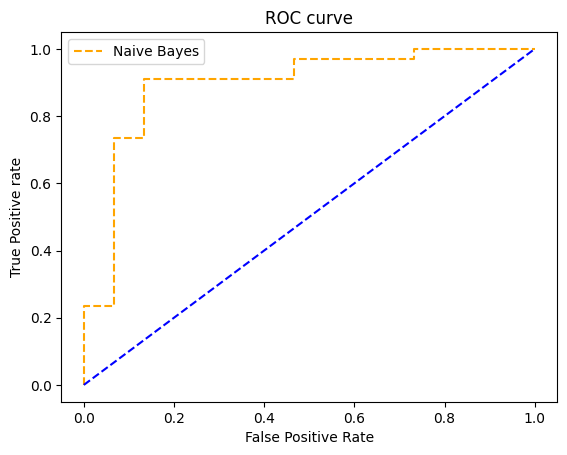

In [30]:
## plot roc curves
plt.plot(fpr, tpr, linestyle='--',color='orange', label='Naive Bayes')

plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [31]:
## compute F1-score
f1_score = f1_score(y_test, clf.predict(X_test))

# print F1-score
print(f1_score)

0.8918918918918919


In [32]:
## compute accuracy

accuracy = accuracy_score(y_test, clf.predict(X_test))

# print accuracy
print(accuracy)


0.8367346938775511


## 6. Testing model performance on a few reviews 

In [33]:
# pass through the transform (not fit_transform)

test1 = np.array(["It's best place to get Ethiopian spices and food staffs"])

test1 = vectorizer.transform(test1)

print(clf.predict(test1))

[1]


In [34]:
test2 = np.array(["The garri there sell is full of sand my advised to everyone is to avoid that garri please this garri can give you appendicitis be careful"])

test2 = vectorizer.transform(test2)

print(clf.predict(test2))

[0]


In [35]:
test3 = np.array(["I purchased a 2kg custard powder four days ago July 27, 2022 and discovered it was expiring August 2022. I called store August 1,2022 to make the complaint and was told there's nothing that can be done since it was bought in July. Worst customer service ever!"])

test3 = vectorizer.transform(test3)

print(clf.predict(test3))

[0]


## 7. Applying model to make sentiment prediction to all text reviews 

In [36]:
# pass through the transform (not fit_transform)

df_to_label['Naive_Bayes'] = np.array(df_to_label['review_text'])

sentiment  = vectorizer.transform(df_to_label['Naive_Bayes'])

print(clf.predict(sentiment))

[1 1 1 ... 1 1 1]


In [37]:
df_to_label['Naive_Bayes'] = clf.predict(sentiment)

In [38]:
df_to_label

,city,name,reviews,rating,review_id,review_text,review_rating,review_datetime_utc,review_text_clean,text_tokenized,tokenized_nostop,string_nostop,Naive_Bayes
0,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNhOWN6TlJ3EAE,Very friendly people from my home country ethiopian. Always good service and friendly community.,5,8/6/2021 1:33,Very friendly people from my home country ethiopian Always good service and friendly community,"[very, friendly, people, from, my, home, country, ethiopian, always, good, service, and, friendly, community]","[friendly, people, home, country, ethiopian, always, good, service, friendly, community]",friendly people home country ethiopian always good service friendly community,1
1,Calgary,African Variety Store,21.0,4.0,ChdDSUhNMG9nS0VJQ0FnSURZbmZ6d2tBRRAB,It's best place to get Ethiopian spices and food staffs,5,5/18/2019 20:55,Its best place to get Ethiopian spices and food staffs,"[its, best, place, to, get, ethiopian, spices, and, food, staffs]","[best, place, get, ethiopian, spices, food, staffs]",best place get ethiopian spices food staffs,1
2,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNpbnU3LVl3EAE,It was a great fresh whole lamb,5,11/3/2020 16:23,It was a great fresh whole lamb,"[it, was, a, great, fresh, whole, lamb]","[great, fresh, whole, lamb]",great fresh whole lamb,1
3,Calgary,African Variety Store,21.0,4.0,ChZDSUhNMG9nS0VJQ0FnSUNCLWRXNllREAE,"Their berbere is not the right one,,,,",1,12/30/2022 9:03,Their berbere is not the right one,"[their, berbere, is, not, the, right, one]","[berbere, right, one]",berbere right one,1
4,Calgary,African Choice Market,93.0,4.2,ChZDSUhNMG9nS0VJQ0FnSURjOEthWFlBEAE,"I have been a long time customer of this store and have always had great experience. However, recently, with the change in staffing my experiences has been less than pleasant. Today, I attended to do my regular shopping as usual and noticed that their prices has increase drastically. I was buying this items for my mom, who is not in Calgary. I bought a pepper, even though there was no price anywhere the item was located. It occurred to me after leaving the store to check with my mom whether or not she would be fine with the 10 dollar price on such a small amount of pepper. She said not to buy it and to return it. I returned to the store less than 5 minutes later only for them to be telling me that they are not doing returns due to covid 19. Which is understandable. However, this needs to be made aware to all customers when arriving at the door not behind your counter where no one ever thought to look. further, there is nothing preventing your store associates mention that to every customers to further reinforce that information. After the store associate realized that I was going to stay there as long as it takes for her to refund my money, she did. This experience left a bad taste in my mouth and would like to see improvement.",1,5/17/2020 0:19,I have been a long time customer of this store and have always had great experience However recently with the change in staffing my experiences has been less than pleasant Today I attended to do my regular shopping as usual and noticed that their prices has increase drastically I was buying this items for my mom who is not in Calgary I bought a pepper even though there was no price anywhere the item was located It occurred to me after leaving the store to check with my mom whether or not she would be fine with the 10 dollar price on such a small amount of pepper She said not to buy it and to return it I returned to the store less than 5 minutes later only for them to be telling me that they are not doing returns due to covid 19 Which is understandable However this needs to be made aware to all customers when arriving at the door not behind your counter where no one ever thought to look further there is nothing preventing your store associates mention that to every customers to further reinforce that information After the st